<a href="https://colab.research.google.com/github/dzkmrn/2141720076-pcvk-2023/blob/main/week_05_gamma_corr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Week 5**

### Muhammad Dzaka Murran Rusid | 2141720076 | TI-3H

#### **Tugas Praktikum**

1. Buat Gamma Correction sesuai dengan petunjuk berikut
Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai
Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk
meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image
dengan gamma correction sesuai rumus yang telah diberikan.

In [ ]:
# Impor library
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from skimage import transform
from PIL import Image
import matplotlib.pylab as plt

In [ ]:
# read image
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive


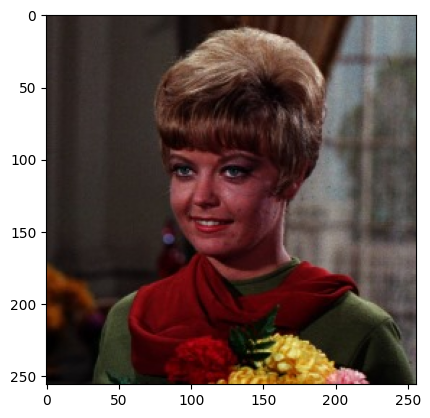

In [ ]:
image = cv.imread('/content/drive/MyDrive/cewe.jpg')
converseimg = cv.cvtColor(image, cv.COLOR_BGR2RGB)

plt.imshow(converseimg)

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


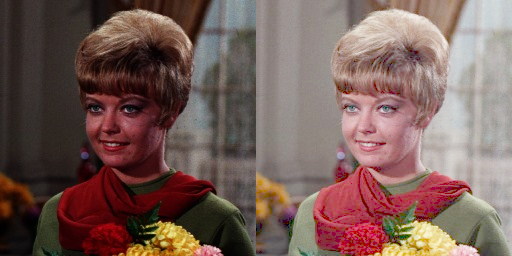

In [ ]:
# 1. Buat Gamma Correction
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
  gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, not a number')

original = cv.cvtColor(converseimg,cv.COLOR_BGR2RGB)
gamma_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
     gamma_image[y,x,c] = np.clip(255 * pow(original[y,x,c] / 255, (1/gamma)), 0, 255)

final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

2. Buat Simulasi Image Depth
Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra,
pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada
pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga
255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (000
0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika
7bit, maka jumlah warnanya adalah 27 = 128, dst.

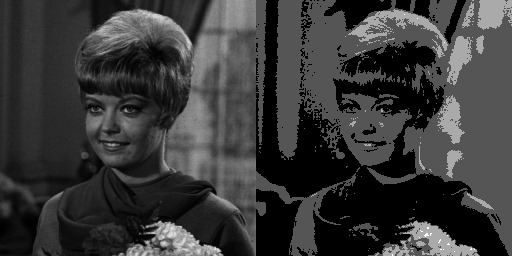

In [ ]:
# 2. Buat Simulasi Image Depth
bit_depth=2 # nilai kedalaman
level = 255 / (pow(2,bit_depth)-1) # Rumus menentukan level kedalaman
original_depth = cv.imread('/content/drive/MyDrive/cewe.jpg', cv.IMREAD_GRAYSCALE)
depth_img = np.zeros(original_depth.shape, original_depth.dtype)

for y in range(original_depth.shape[0]):
  for x in range(original_depth.shape[1]):
    depth_img[y] = np.clip(np.round(original_depth[y]/level)*level, 0, 255) # Rumus Depth

final_frame = cv.hconcat((original_depth, depth_img))
cv2_imshow(final_frame)

3. Buat modul Average Denoising
Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab
sebelumnya.
Citra asli sudah disediakan pada /images/galaxy.jpg.
100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg
Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder ,
gunakan modul glob (import glob).

Nilai PSNR untuk citra 5  adalah 27.52877195336348 (dB)


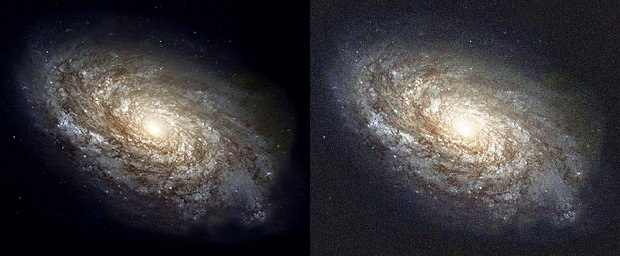

Nilai PSNR untuk citra 10  adalah 27.550115645396737 (dB)


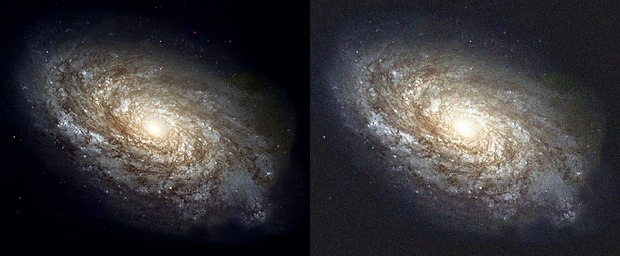

Nilai PSNR untuk citra 20  adalah 27.536846638860904 (dB)


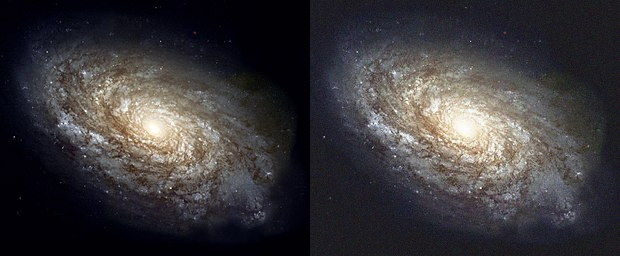

Nilai PSNR untuk citra 40  adalah 27.501700899315868 (dB)


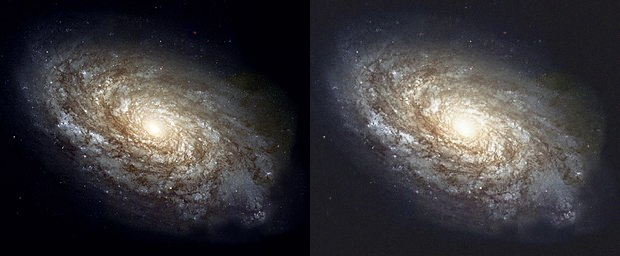

Nilai PSNR untuk citra 80  adalah 27.509665756439283 (dB)


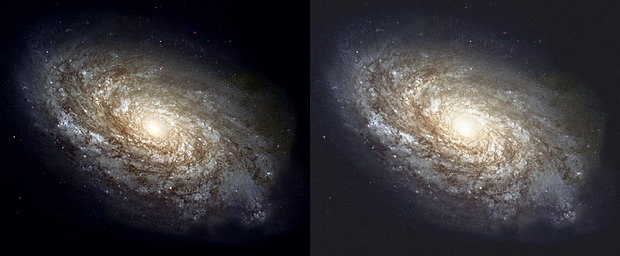

Nilai PSNR untuk citra 100  adalah 27.513201332601774 (dB)


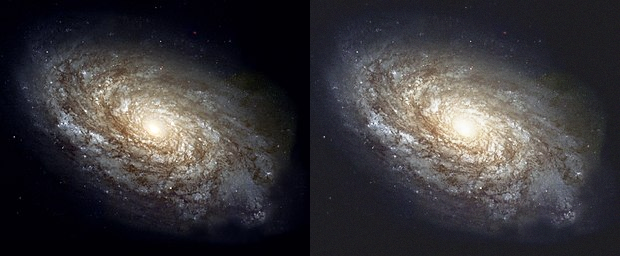

In [ ]:
import glob
from math import log10, sqrt
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

original = cv.imread('/content/drive/MyDrive/galaxy.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

def calculate_average_psnr(cv_img, noise_number):
    dst = cv_img[0]
    for i in range(noise_number):
        if i == 0:
            pass
        else:
            alpha = 1.0 / (i + 1)
            beta = 1.0 - alpha
            dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

    def PSNR(original, compressed):
        mse = np.mean((original - compressed) ** 2)
        if mse == 0:
            return 100
        max_pixel = 255.0
        psnr = 20 * log10(max_pixel / sqrt(mse))
        return psnr

    compressed = dst
    psnr = PSNR(original, compressed)

    print(f'Nilai PSNR untuk citra {noise_number}  adalah {psnr} (dB)')
    galaxy_frame = cv.hconcat((original, dst))
    cv2_imshow(galaxy_frame)

calculate_average_psnr(cv_img, 5)
calculate_average_psnr(cv_img, 10)
calculate_average_psnr(cv_img, 20)
calculate_average_psnr(cv_img, 40)
calculate_average_psnr(cv_img, 80)
calculate_average_psnr(cv_img, 100)

Dari hasil PSNR yang anda catat pada tabel diatas, kesimpulan yang dapat diambil adalah:

1. PSNR Menunjukkan Stabilitas: Terlihat bahwa nilai PSNR cenderung stabil ketika noise_number (tingkat kebisingan) bervariasi dari 5 hingga 100. Nilai PSNR tetap berada dalam kisaran sekitar 27.5 dB. Ini mengindikasikan bahwa kualitas gambar tetap terjaga dengan baik dan tidak mengalami perubahan signifikan meskipun tingkat kebisingan berubah.

2. Kualitas Gambar yang Baik pada Tingkat Kebisingan Rendah: Dengan nilai PSNR sekitar 27.5 dB, kita dapat menyimpulkan bahwa gambar memiliki tingkat kebisingan yang rendah. Hal ini menunjukkan bahwa gambar masih memiliki kualitas yang tinggi dan sedikit sekali distorsi yang disebabkan oleh kebisingan.

3. Sensitivitas Terhadap Perubahan noise_number: Meskipun perubahan noise_number tidak mengakibatkan perubahan yang signifikan pada nilai PSNR, kita dapat melihat adanya fluktuasi kecil dalam PSNR ketika noise_number meningkat dari 5 hingga 100. Ini menyarankan bahwa gambar mungkin lebih responsif terhadap tingkat kebisingan yang berbeda, terutama pada nilai noise_number tertentu.

Kesimpulannya, gambar tersebut menunjukkan kualitas yang baik dalam menghadapi kebisingan, dengan nilai PSNR yang stabil dan tingkat kebisingan yang rendah. Namun, kita perlu memperhatikan fluktuasi kecil yang terjadi pada beberapa tingkat kebisingan tertentu, terutama jika kualitas gambar harus tetap terjaga pada tingkat kebisingan yang lebih tinggi.


4. Buat image masking untuk image berikut. Image kiri adalah image asli (image KTP),
sedangkan image paling kanan adalah hasilnya:

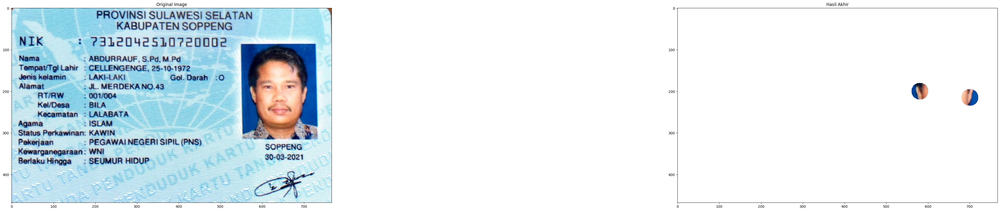

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Membaca gambar asli
image_path = '/content/drive/MyDrive/ktporang.jpeg'
original_image = cv.imread(image_path)

# Membuat maska dengan dua lingkaran putih
mask = np.zeros(original_image.shape[:2], dtype="uint8")
cv.circle(mask, (580, 200), 20, 255, -1)
cv.circle(mask, (700, 215), 20, 255, -1)

# Menggunakan operasi bitwise untuk mendapatkan bagian gambar yang ada di dalam maska
masked = cv.bitwise_and(original_image, original_image, mask=mask)

# Mengonversi gambar menjadi grayscale
tmp = cv.cvtColor(masked, cv.COLOR_BGR2GRAY)

# Menggunakan teknik thresholding
_, alpha = cv.threshold(tmp, 0, 255, cv.THRESH_BINARY)

# Memisahkan saluran warna Red, Green, Blue dari gambar asli
b, g, r = cv.split(masked)

# Membuat list yang berisi saluran warna Red, Green, Blue, dan saluran alpha
rgba = [b, g, r, alpha]

# Menggunakan cv.merge() untuk menggabungkan keempat saluran ke dalam gambar RGBA
final = cv.merge(rgba)

# Menampilkan gambar samping-sampingan menggunakan matplotlib
plt.figure(figsize=(40, 30))

# Gambar asli
plt.subplot(131)
plt.imshow(cv.cvtColor(original_image, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('on')

# Maska
plt.subplot(132)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('on')

# Hasil akhir dengan latar belakang transparan
plt.subplot(133)
plt.imshow(cv.cvtColor(final, cv.COLOR_BGRA2RGBA))
plt.title('Hasil Akhir')
plt.axis('on')

plt.tight_layout()
plt.show()

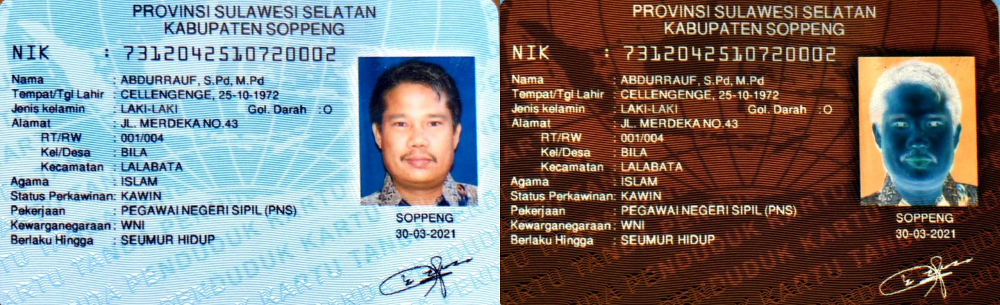

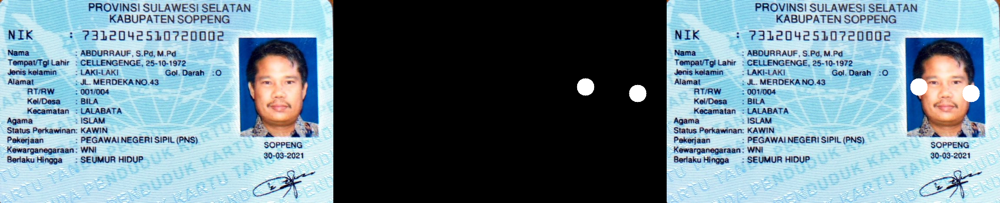

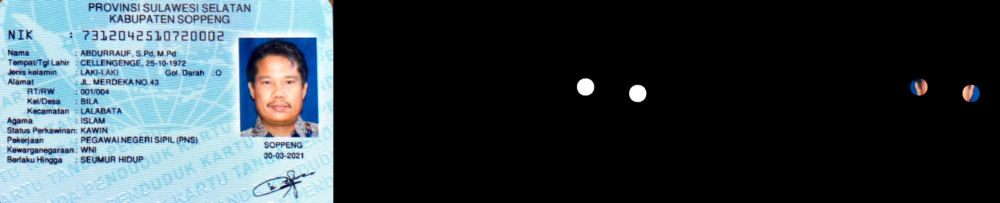

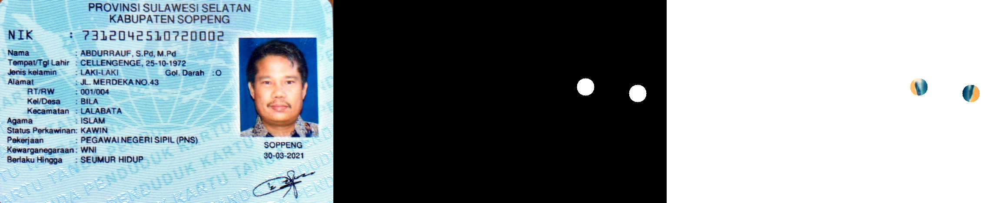

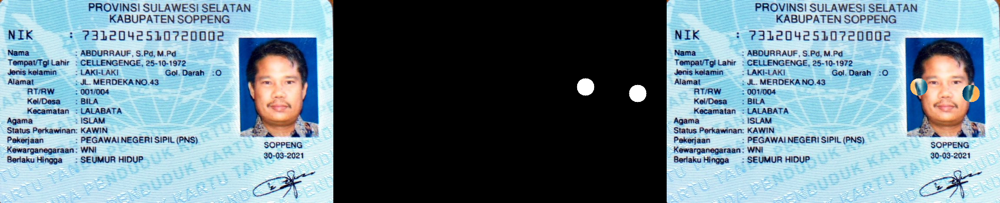

In [ ]:
ktpaja = original_image
inot = ~ktpaja
ior = ktpaja | cv.cvtColor(mask, cv.COLOR_GRAY2BGR)
iand = ktpaja & cv.cvtColor(mask, cv.COLOR_GRAY2BGR)
inand = ~(ktpaja & cv.cvtColor(mask, cv.COLOR_GRAY2BGR))
ixor = ktpaja ^ cv.cvtColor(mask, cv.COLOR_GRAY2BGR)

cv2_imshow(cv.hconcat((ktpaja, inot)))
cv2_imshow(cv.hconcat((ktpaja, cv.cvtColor(mask, cv.COLOR_GRAY2BGR),ior)))
cv2_imshow(cv.hconcat((ktpaja, cv.cvtColor(mask, cv.COLOR_GRAY2BGR),iand)))
cv2_imshow(cv.hconcat((ktpaja, cv.cvtColor(mask, cv.COLOR_GRAY2BGR),inand)))
cv2_imshow(cv.hconcat((ktpaja, cv.cvtColor(mask, cv.COLOR_GRAY2BGR),ixor)))

### Analisis

Eksperimen yang melibatkan operasi logika dalam masking gambar menggunakan operator AND, OR, NOT, NAND, dan XOR bertujuan untuk menggabungkan atau mengubah piksel dalam gambar dengan berbagai metode. Berikut ini kesimpulan yang dapat diambil dari percobaan tersebut:

Operator AND: Dalam penggunaan operasi AND, kita menggabungkan dua piksel atau lebih dengan aturan bahwa piksel output hanya akan aktif (putih) jika semua piksel input aktif. Ini digunakan untuk menjaga hanya bagian yang tumpang tindih antara dua objek dalam gambar yang tetap terlihat.

Operator OR: Dalam operasi OR, kita menggabungkan dua piksel atau lebih dengan aturan bahwa piksel output akan aktif jika salah satu atau lebih dari piksel input aktif. Ini digunakan untuk menggabungkan beberapa objek dalam gambar.

Operator NOT: Operator NOT digunakan untuk mengubah piksel input menjadi kebalikan dari keadaan semula. Piksel yang sebelumnya aktif menjadi non-aktif (hitam), dan sebaliknya. Ini dapat digunakan untuk menciptakan efek negatif pada gambar.

Operator NAND: Operasi NAND adalah kebalikan dari operasi AND, di mana piksel output hanya akan non-aktif jika semua piksel input aktif. Ini dapat digunakan untuk memisahkan elemen-elemen dalam gambar.

Operator XOR: Operasi XOR digunakan untuk menghasilkan piksel output yang aktif jika hanya salah satu dari dua piksel input yang aktif, tetapi tidak keduanya. Ini berguna untuk menyoroti perbedaan antara dua gambar atau elemen dalam gambar.

Dalam percobaan ini, kita memahami bagaimana operator logika dapat digunakan untuk memodifikasi gambar dengan berbagai cara, sesuai dengan keperluan dan tujuan dalam pengolahan gambar yang lebih kompleks. Kesimpulannya, pemahaman tentang operator logika ini menjadi kunci untuk mengembangkan teknik-teknik pemrosesan gambar yang lebih lanjut.